<a href="https://colab.research.google.com/github/Eng-Abdulmalik/Eng-Abdulmalik/blob/main/Seg_Unet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [22]:
from google.colab import drive
drive.mount('/content/gdrive/')


Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


In [ ]:
cd '/content/gdrive/My Drive/'

/content/gdrive/My Drive


In [23]:
import numpy as np
from matplotlib import pyplot as plt
import cv2
import glob
import copy
%matplotlib inline
import skimage.filters
import skimage.exposure
import skimage.filters.rank
import skimage.morphology
import scipy.ndimage
import os
import matplotlib.image as img
from skimage.feature import hessian_matrix, hessian_matrix_eigvals
from skimage.filters import hessian
from skimage import morphology

In [24]:
pip install -U scikit-learn

In [25]:
#input data preparation
import torch
import os
import cv2
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

(array([0.00000e+00, 2.87468e+05, 5.03200e+03, 3.42200e+03, 1.46200e+03,
        1.71000e+03, 1.00300e+03, 2.32400e+03, 2.44300e+03, 4.79900e+03,
        5.35900e+03, 4.93500e+03, 8.36100e+03, 6.12700e+03, 1.10310e+04,
        9.07900e+03, 1.48510e+04, 1.09790e+04, 1.82990e+04, 1.39380e+04,
        2.27090e+04, 2.55300e+04, 1.83510e+04, 2.83790e+04, 1.96360e+04,
        3.04210e+04, 2.06460e+04, 3.05130e+04, 2.00630e+04, 2.88290e+04,
        2.65320e+04, 1.68490e+04, 2.30010e+04, 1.47480e+04, 2.02810e+04,
        1.21020e+04, 1.77810e+04, 1.12830e+04, 1.52720e+04, 9.10000e+03,
        1.30130e+04, 1.17060e+04, 6.92400e+03, 9.69900e+03, 5.90100e+03,
        8.18800e+03, 4.99700e+03, 6.74100e+03, 4.16800e+03, 5.66300e+03,
        5.07600e+03, 3.10000e+03, 4.13600e+03, 2.55800e+03, 3.65800e+03,
        2.12800e+03, 2.99900e+03, 1.66300e+03, 2.41000e+03, 1.45200e+03,
        2.05000e+03, 1.80600e+03, 1.07600e+03, 1.48100e+03, 9.07000e+02,
        1.18200e+03, 8.09000e+02, 1.08000e+03, 6.92

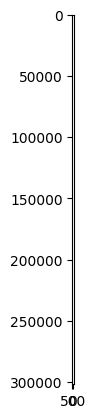

In [26]:
img = '/content/gdrive/My Drive/RSAN/Chase/train/image/Image_01R.jpg'
img = cv2.imread(img)
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
plt.imshow(img)
#channel splitting
imgR = img[:,:,0]
imgG = img[:,:,1]
imgB = img[:,:,2]
#histogram function, returns list with frequencies
def drawHistogram(img):
    his = np.zeros(256,)
    a = img.flatten()
    for i in a:
        his[i] = his[i]+1
    return his
#clahe operation on the Green channel of image
clahe = cv2.createCLAHE(clipLimit=3, tileGridSize=(8,8))
clahe_img = clahe.apply(imgG)
plt.hist(clahe_img.flat, bins=100, range=(0,255))

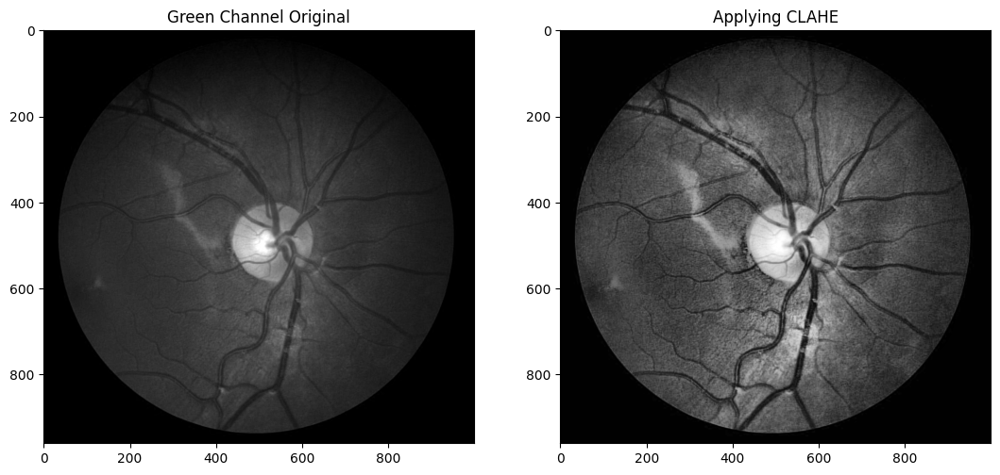

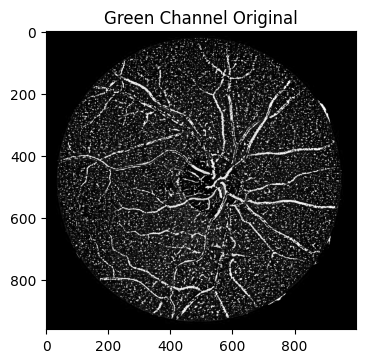

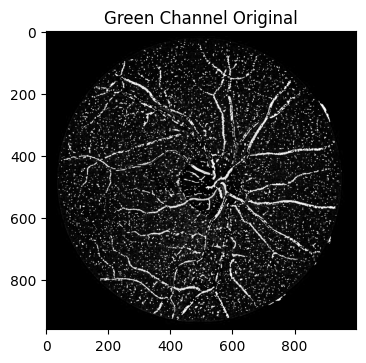

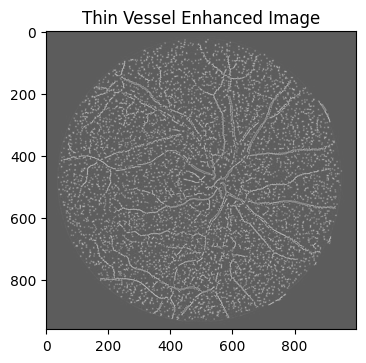

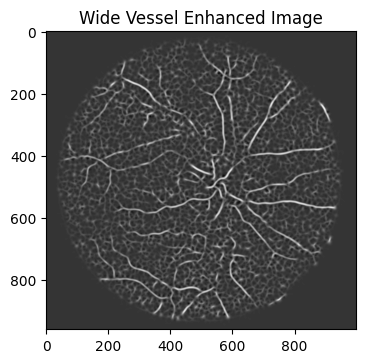

In [27]:
#checking effect of Clahe
fig = plt.figure(figsize=(20, 20))
fig.add_subplot(1, 3, 1)
plt.imshow(imgG,cmap='gray')
plt.title('Green Channel Original')
fig.add_subplot(1, 3, 2)
plt.imshow(clahe_img,cmap='gray')
plt.title('Applying CLAHE')
#morphological operations, Here we do opening then closing
cell_disc = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(9,9))
Topen = cv2.morphologyEx(clahe_img,cv2.MORPH_OPEN,cell_disc)
Tclose = cv2.morphologyEx(Topen, cv2.MORPH_CLOSE, cell_disc)
# cell_disc1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5))
# Tclose = cv2.morphologyEx(Topen, cv2.MORPH_DILATE, cell_disc1)

#gtting the tophat image
TopHat = (clahe_img - Tclose)#.astype(np.uint8)
#checking the tophat image
fig = plt.figure(figsize=(4, 4))
fig.add_subplot(1, 1, 1)
plt.imshow(TopHat,cmap='gray')
plt.title('Green Channel Original')
#More morphological operations, erosion then dilation
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(2,2))
min_image = cv2.erode(TopHat, kernel)
min_image = cv2.dilate(min_image, kernel)
fig = plt.figure(figsize=(4, 4))
fig.add_subplot(1, 1, 1)
plt.imshow(min_image,cmap='gray')
plt.title('Green Channel Original')
#thresholding function
def threshold(img,k):
    ret = copy.deepcopy(img)
    ret[ret<k] = 0
    ret[ret>=k] = 255
    return ret
#hessian matrix and eigenvalues approach to get thin vessel enhanced image
HessThin = hessian_matrix(min_image, sigma=1.2, order='rc')
EignThin = hessian_matrix_eigvals(HessThin) [1]
fig = plt.figure(figsize=(4, 4))
plt.title("Thin Vessel Enhanced Image")
plt.imshow(1-EignThin, cmap=plt.cm.gray)
#hessian matrix and eigenvalues approach to get wide vessel enhanced image
HessWide = hessian_matrix(min_image, sigma=4, order='rc')
EignWide = hessian_matrix_eigvals(HessWide) [1]
fig = plt.figure(figsize=(4, 4))
plt.title("Wide Vessel Enhanced Image")
plt.imshow(1-EignWide, cmap='gray')

In [29]:
#global otsu thresholding function
def GlobalOtsu(img):
    foreground = img[img>=0]
    background = img[img<0]

    final_var = (np.var(foreground) * len(foreground) + np.var(background) * len(background))/(len(foreground) + len(background))
    if(np.isnan(final_var)):
        final_var = -1

    final_thresh = 0
    for i in np.linspace(np.min(img), np.max(img), num=255):
        foreground = img[img>=i]
        background = img[img<i]
        var = (np.var(foreground) * len(foreground) + np.var(background) * len(background))/(len(foreground) + len(background))

        if(np.isnan(var)):
            var = -1

        if(var!=-1 and (var<final_var or final_var ==-1)):
            final_var = var
            final_thresh = i
    return threshold(img,final_thresh)
    #Area based thresholding/cleaning. Done as postprocessing step
def AreaThreshold(img, area = 5):
    nlabels,labels,stats,centroid = cv2.connectedComponentsWithStats(np.uint8(img), 4, cv2.CV_32S)

    output = np.copy(img)

    for i in range(output.shape[0]):
        for j in range(output.shape[1]):
            if stats[labels[i][j], cv2.CC_STAT_AREA] < area:
                output[i][j] = 0

    return output

In [30]:
#Local otsu thresholding
from skimage.filters import threshold_otsu, rank
from skimage.morphology import disk

def LocalOtsu1(img,radius = 5):
    selem = disk(radius)

    local_otsu = rank.otsu(img, selem)
    output = np.copy(img)

    output[output < local_otsu] = 0
    output[output >= local_otsu] = 255

    return output

In [31]:
#local Otsu thresholding function as per paper with offset included
def LocalOtsu2(img,radius = 15):
    selem = disk(radius)

    local_otsu = rank.otsu(img, selem)
    output = np.copy(img)
    rng = local_otsu.max() - local_otsu.min()
    mid = rng/2 + local_otsu.min()

    local_otsu[local_otsu<mid] = mid

    output[output < local_otsu] = 0


    return output
#different accuracy metrics used are returned by this function
def AccuracyMetrics(img,imggt):
    matches = np.copy(img[img==imggt])
    mismatches = np.copy(img[img!=imggt])
    TP = sum(matches==255)
    TN = sum(matches==0)
    FP = sum(mismatches==255)
    FN = sum(mismatches==0)
#     print(matches.shape)
#     print(mismatches.shape)
#     print("TP ",TP)
#     print("TN ",TN)
#     print("FP ",FP)
#     print("FN ",FN)
    Acc = (TP+TN)/(TP+TN+FP+FN)
    Sn = TP/(TP+FN)
    Sp = TN/(TN+FP)
    Auc = (Sn+Sp)/2

    return Acc,Sn,Sp,Auc

In [32]:
pip install PyWavelets

In [33]:
import pywt

#using wavelet method for image fusion
def image_fusion(img1,img2):
    w1 = pywt.wavedec2(img1, 'db1')
    w2 = pywt.wavedec2(img2, 'db1')
    elem = (w1[0]+w2[0])/2
    fw = [elem]

    for i in range(len(w1)-1):
        x,y,z = (w1[i+1][0] + w2[i+1][0])/2, (w1[i+1][1] + w2[i+1][1])/2, (w1[i+1][2] + w2[i+1][2])/2
        fw.append((x,y,z))

    output = pywt.waverec2(fw, 'db1')

#     Normalisation, May or May not be required
    amin = np.min(output)
    amax = np.max(output)
    output = 255* ((output - amin)/(amax-amin))

    output = cv2.resize(output,img1.T.shape)
    return output
#Global otsu thresholding
val1 = GlobalOtsu(1-EignWide)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3715: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:223: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:257: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


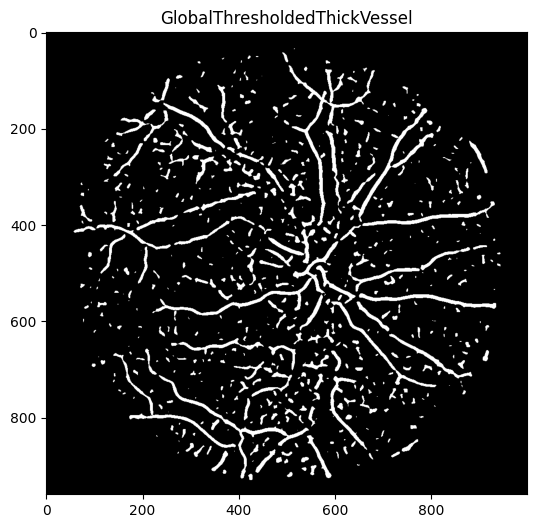

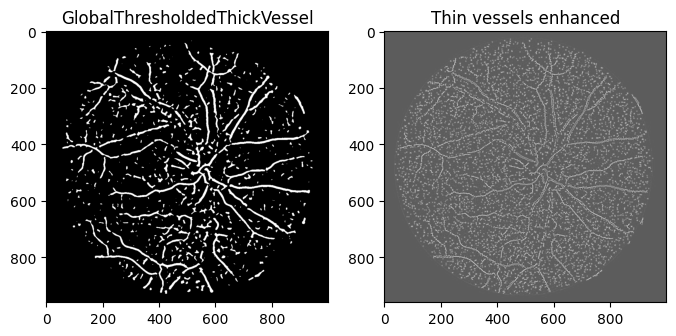

In [34]:
#Global otsu thresholded image
fig = plt.figure(figsize=(8, 6))
plt.imshow(val1,cmap='gray')
plt.title("GlobalThresholdedThickVessel")
#normalising the images for further processing
thinN = cv2.normalize(1-EignThin,  None, 0, 255, cv2.NORM_MINMAX)
val1 = cv2.normalize(val1,  None, 0, 70, cv2.NORM_MINMAX)
#Two images that have to be fused
fig = plt.figure(figsize=(8, 6))
fig.add_subplot(1, 2, 1)
plt.imshow(val1,cmap='gray')
plt.title('GlobalThresholdedThickVessel')
fig.add_subplot(1, 2, 2)
plt.imshow(thinN,cmap='gray')
plt.title('Thin vessels enhanced')
#fusing the images
test1 = image_fusion(val1,thinN)

Text(0.5, 1.0, 'Pixel/Area based Thresholding')

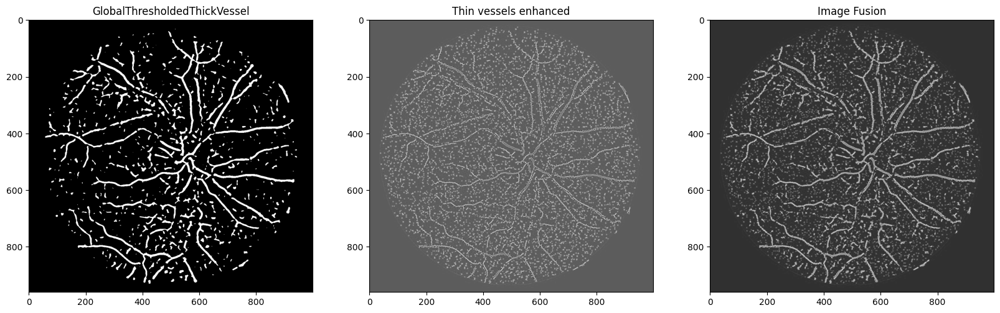

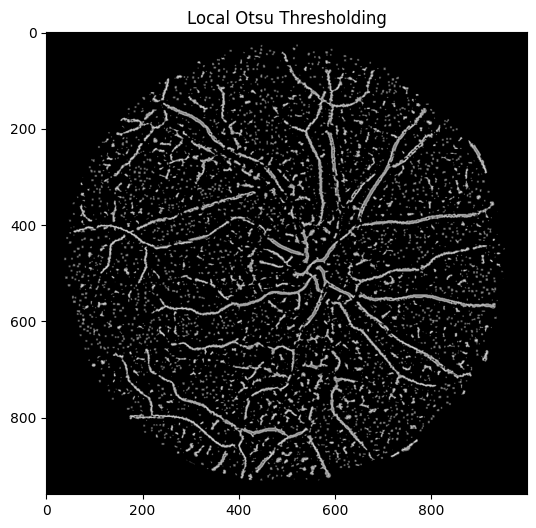

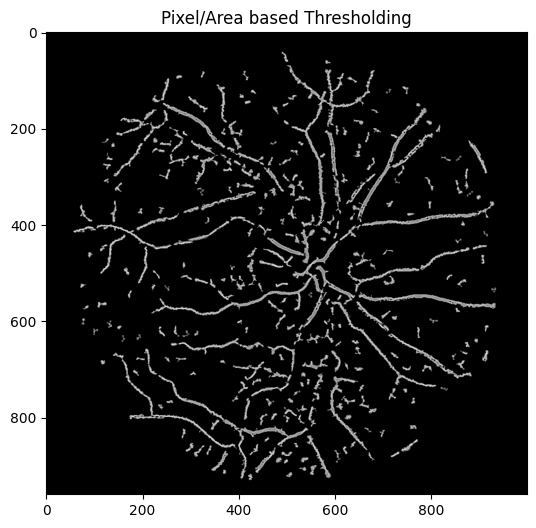

In [35]:
#comparing the fused image with originals
fig = plt.figure(figsize=(20, 10))
fig.add_subplot(1, 3, 1)
plt.imshow(val1,cmap='gray')
plt.title('GlobalThresholdedThickVessel')
fig.add_subplot(1, 3, 2)
plt.imshow(thinN,cmap='gray')
plt.title('Thin vessels enhanced')
fig.add_subplot(1, 3, 3)
plt.imshow(test1,cmap='gray')
plt.title("Image Fusion")
#local otsu thresholding on the fused image
lOtsu = LocalOtsu2(test1.astype('uint8'))
fig = plt.figure(figsize=(8, 6))
plt.imshow(lOtsu,cmap='gray')
plt.title("Local Otsu Thresholding")
#area thresholding to remove non vessel regions
final = AreaThreshold(lOtsu,50)
fig = plt.figure(figsize=(8, 6))
plt.imshow(final,cmap='gray')
plt.title("Pixel/Area based Thresholding")

In [36]:
pip install patchify

In [37]:
import os
import cv2
import numpy as np
import skimage.io
from matplotlib import pyplot as plt
from patchify import patchify, unpatchify



from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.models import Model

def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def encoder_block(input, num_filters):
    x = conv_block(input, num_filters)
    p = MaxPool2D((2, 2))(x)
    return x, p

def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def unetmodel(input_shape):
    inputs = Input(input_shape)

    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    b1 = conv_block(p4, 1024)

    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)

    model = Model(inputs, outputs, name="U-Net")
    return model

Resizing training images and masks


100%|██████████| 2/2 [00:00<00:00,  6.28it/s]


Resizing test images


100%|██████████| 2/2 [00:00<00:00,  6.48it/s]


Done!
Resizing test Masks


100%|██████████| 2/2 [00:00<00:00, 98.98it/s]


Done!


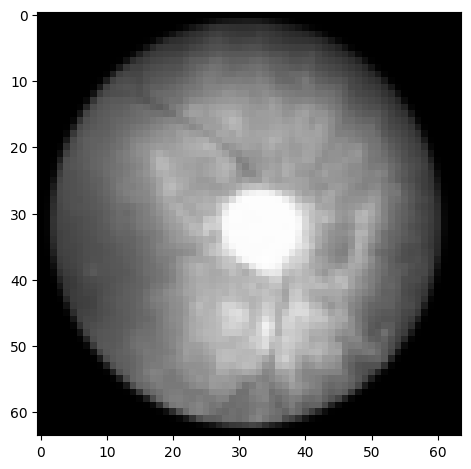

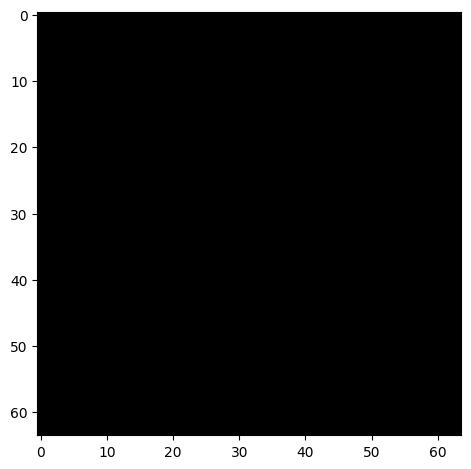

In [38]:
import skimage.io
from matplotlib import pyplot as plt
from patchify import patchify, unpatchify

import tensorflow as tf
import os
import random
import numpy as np

from tqdm import tqdm

from skimage.io import imread, imshow
from skimage.transform import resize
import matplotlib.pyplot as plt

seed = 42
np.random.seed = seed

testimg = []
ground_truth = []
prediction = []
global_IoU = []
global_accuracy = []

IMG_WIDTH = 64
IMG_HEIGHT = 64
IMG_CHANNELS = 1

## Dataset path ##
TRAIN_PATH = '/content/gdrive/My Drive/RSAN/Chase/train/'
TEST_PATH = '/content/gdrive/My Drive/RSAN/Chase/train/'

train_ids = next(os.walk(TRAIN_PATH))[1]
test_ids = next(os.walk(TEST_PATH))[1]

X_train = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
Y_train = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.bool_)

print('Resizing training images and masks')
for n, id_ in tqdm(enumerate(train_ids), total=len(train_ids)):
    path = TRAIN_PATH
    img = imread(path + 'image/' +  'Image_01R.jpg')[:,:,:IMG_CHANNELS]
    img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    X_train[n] = img  #Fill empty X_train with values from img
    mask = np.zeros((IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.bool_)
    for mask_file in next(os.walk(path ))[2]:
        mask_ = imread(path + 'label/' + 'Image_10R_1stHO.png')
        mask_ = np.expand_dims(resize(mask_, (IMG_HEIGHT, IMG_WIDTH), mode='constant',
                                      preserve_range=True), axis=-1)
        mask = np.maximum(mask, mask_)

    Y_train[n] = mask
# test images
X_test = np.zeros((len(test_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
sizes_test = []
print('Resizing test images')
for n, id_ in tqdm(enumerate(test_ids), total=len(test_ids)):
    path = TEST_PATH
    img = imread(path + 'image/' +  'Image_01R.jpg')[:,:,:IMG_CHANNELS]
    sizes_test.append([img.shape[0], img.shape[1]])
    img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    X_test[n] = img

print('Done!')

#test Masks
Y_test = np.zeros((len(test_ids), 64, 64), dtype=np.uint8)
sizes_test = []
print('Resizing test Masks')
for n, id_ in tqdm(enumerate(test_ids), total=len(test_ids)):
    path = TEST_PATH
    imge = imread(path + 'label/' +  'Image_10R_1stHO.png')
    sizes_test.append([imge.shape[0], imge.shape[1]])
    imge = resize(imge, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    Y_test[n] = imge

print('Done!')

image_x = random.randint(0, len(train_ids))
imshow(X_train[image_x])
plt.show()
image_y = random.randint(1, len(train_ids))
imshow(Y_train[image_y])
plt.show()


Model: "U-Net"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_11 (InputLayer)       [(None, 64, 64, 1)]          0         []                            
                                                                                                  
 conv2d_190 (Conv2D)         (None, 64, 64, 64)           640       ['input_11[0][0]']            
                                                                                                  
 batch_normalization_180 (B  (None, 64, 64, 64)           256       ['conv2d_190[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_180 (Activation  (None, 64, 64, 64)           0         ['batch_normalization_180[

Text(0.5, 1.0, 'Final Output')

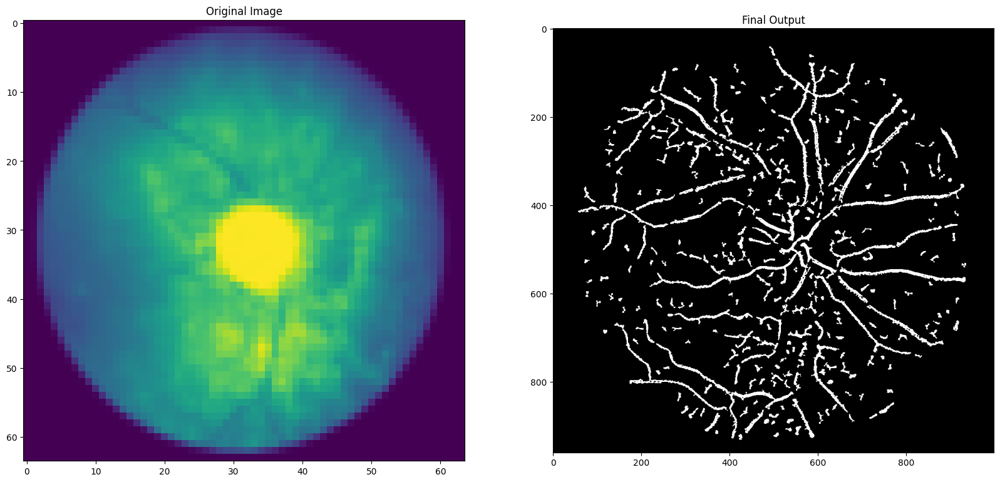

In [89]:


import os
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.losses import binary_crossentropy

smooth = 1e-15
def dice_coef(y_true, y_pred):
    y_true = tf.keras.layers.Flatten()(y_true)
    y_pred = tf.keras.layers.Flatten()(y_pred)
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)

def dice_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred)

def iou(y_true, y_pred):
    def f(y_true, y_pred):
        intersection = (y_true * y_pred).sum()
        union = y_true.sum() + y_pred.sum() - intersection
        x = (intersection + smooth) / (union + smooth)
        x = x.astype(np.float32)
        return x
    return tf.numpy_function(f, [y_true, y_pred], tf.float32)

def bce_dice_loss(y_true, y_pred):
    return binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)

def focal_loss(y_true, y_pred):
    alpha=0.25
    gamma=2
    def focal_loss_with_logits(logits, targets, alpha, gamma, y_pred):
        weight_a = alpha * (1 - y_pred) ** gamma * targets
        weight_b = (1 - alpha) * y_pred ** gamma * (1 - targets)
        return (tf.math.log1p(tf.exp(-tf.abs(logits))) + tf.nn.relu(-logits)) * (weight_a + weight_b) + logits * weight_b

    y_pred = tf.clip_by_value(y_pred, tf.keras.backend.epsilon(), 1 - tf.keras.backend.epsilon())
    logits = tf.math.log(y_pred / (1 - y_pred))
    loss = focal_loss_with_logits(logits=logits, targets=y_true, alpha=alpha, gamma=gamma, y_pred=y_pred)
    # or reduce_sum and/or axis=-1
    return tf.reduce_mean(loss)

img_files = sorted(os.listdir(path))

metrics = [
      dice_coef,
      iou,


  ],

input_shape=(64,64,1)
def get_model():
    return unetmodel (input_shape)
model = get_model()
#model.compile(optimizer='adam', loss=total_loss, metrics=metrics)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=metrics)
model.summary()
checkpointer = tf.keras.callbacks.ModelCheckpoint('/content/gdrive/My Drive/model_for_ratina.h5', verbose=1, save_best_only=True)


callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=100, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')]

history = model.fit(X_train,Y_train, validation_split=0.1, batch_size=8, epochs=100, callbacks=callbacks)
print('Done')

final[final!=0] = 255
# fig = plt.figure(figsize=(10, 10))
# plt.imshow(final,cmap='gray')
# plt.title("Final Output")

fig = plt.figure(figsize=(20, 20))
fig.add_subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original Image')
fig.add_subplot(1, 2, 2)
plt.imshow(final,cmap='gray')
plt.title("Final Output")
#model=model.save('Desktop/Demo/ratina_model.hdf5')
####################################

In [90]:
import tensorflow as tf
from datetime import datetime

log_dir = "/content/gdrive/My Drive/logs/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1,
               write_graph=True,
               write_images=True,
               update_freq='epoch',
               profile_batch=2,
               embeddings_freq=1)


In [ ]:

model.fit(X_train,Y_train, epochs=100, validation_data=(X_test, Y_test), callbacks=[tensorboard_callback])
%load_ext tensorboard
%tensorboard --logdir logs


Epoch 1/100
1/1 [==============================] - 16s 16s/step - loss: 0.0000e+00 - dice_coef: 1.0922e-17 - iou: 1.0922e-17 - val_loss: 36.2686 - val_dice_coef: 0.0195 - val_iou: 0.0099
Epoch 2/100
1/1 [==============================] - 15s 15s/step - loss: 0.0000e+00 - dice_coef: 1.1554e-17 - iou: 1.1554e-17 - val_loss: 38.6359 - val_dice_coef: 0.0185 - val_iou: 0.0093
Epoch 3/100
1/1 [==============================] - 14s 14s/step - loss: 0.0000e+00 - dice_coef: 1.1778e-17 - iou: 1.1778e-17 - val_loss: 38.0317 - val_dice_coef: 0.0179 - val_iou: 0.0090
Epoch 4/100
1/1 [==============================] - 14s 14s/step - loss: 0.0000e+00 - dice_coef: 1.2221e-17 - iou: 1.2221e-17 - val_loss: 35.3525 - val_dice_coef: 0.0185 - val_iou: 0.0093
Epoch 5/100
1/1 [==============================] - 15s 15s/step - loss: 0.0000e+00 - dice_coef: 1.2883e-17 - iou: 1.2883e-17 - val_loss: 37.6109 - val_dice_coef: 0.0164 - val_iou: 0.0083
Epoch 6/100
1/1 [==============================] - 14s 14s/step -

In [ ]:
import keras
from sklearn.metrics import confusion_matrix
from keras.callbacks import TensorBoard
log_folder = "/content/gdrive/My Drive/"
callbacks = [
   TensorBoard(log_folder,
               X_train,Y_train,
               validation_data=(X_test, Y_test),
               histogram_freq=1,
               write_graph=True,
               write_images=True,
               update_freq='epoch',
               profile_batch=2,
               embeddings_freq=1),

]

model.fit(X_train, Y_train,
          epochs=100,
          validation_split=0.2,
          callbacks=callbacks)

In [77]:
import tensorflow as tf
from tensorflow.keras.metrics import MeanIoU

# Define the metrics
iou_metric = MeanIoU(num_classes=2)
dice_metric = tf.keras.metrics.MeanIoU(num_classes=2)
jaccard_metric = MeanIoU(num_classes=2)

# Function to calculate metrics and log to TensorBoard
def calculate_and_log_metrics(y_true, y_pred, step):
    iou_metric.update_state(y_true, tf.round(y_pred))
    dice_metric.update_state(y_true, tf.round(y_pred))
    jaccard_metric.update_state(y_true, tf.round(y_pred))

    iou_value = iou_metric.result().numpy()
    dice_value = dice_metric.result().numpy()
    jaccard_value = jaccard_metric.result().numpy()

    print(f"Step: {step}, IoU: {iou_value}, Dice Coefficient: {dice_value}, Jaccard Coefficient: {jaccard_value}")

    # Log metrics to TensorBoard
    with tf.summary.create_file_writer("logs").as_default():
        tf.summary.scalar("IoU", iou_value, step=step)
        tf.summary.scalar("Dice_Coefficient", dice_value, step=step)
        tf.summary.scalar("Jaccard_Coefficient", jaccard_value, step=step)

    # Calculate and log metrics
    calculate_and_log_metrics(X_train, Y_train)


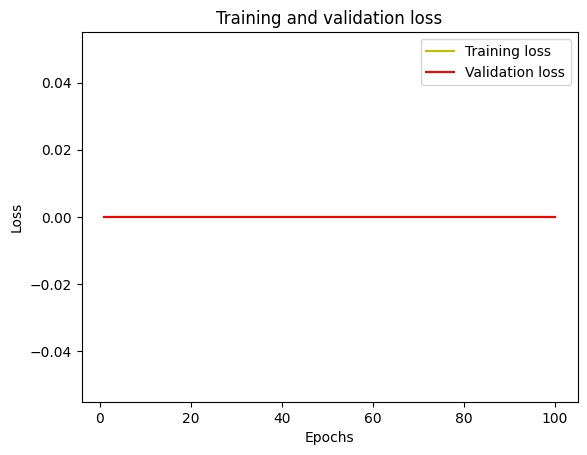

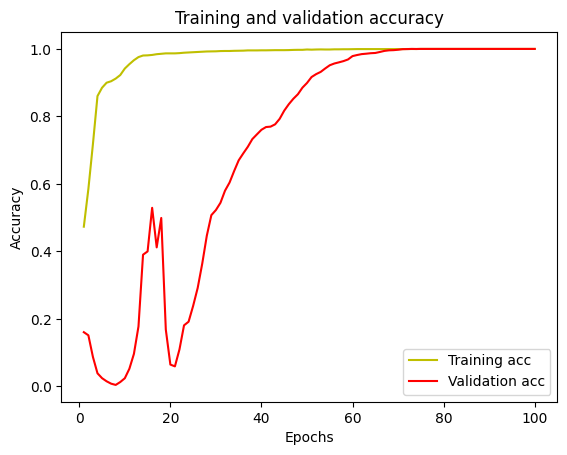

In [43]:
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

acc = history.history['accuracy']
#acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
#val_acc = history.history['val_accuracy']

plt.plot(epochs, acc, 'y', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


In [ ]:
import tensorflow as tf
from tensorflow.keras.metrics import MeanIoU

# Define the metrics
iou_metric = MeanIoU(num_classes=2)
dice_metric = tf.keras.metrics.MeanIoU(num_classes=2)
jaccard_metric = MeanIoU(num_classes=2)

# Function to calculate metrics and log to TensorBoard
def calculate_and_log_metrics(y_true, y_pred, step):
    iou_metric.update_state(y_true, tf.round(y_pred))
    dice_metric.update_state(y_true, tf.round(y_pred))
    jaccard_metric.update_state(y_true, tf.round(y_pred))

    iou_value = iou_metric.result().numpy()
    dice_value = dice_metric.result().numpy()
    jaccard_value = jaccard_metric.result().numpy()

    print(f"Step: {step}, IoU: {iou_value}, Dice Coefficient: {dice_value}, Jaccard Coefficient: {jaccard_value}")

    # Log metrics to TensorBoard
    with tf.summary.create_file_writer("logs").as_default():
        tf.summary.scalar("IoU", iou_value, step=step)
        tf.summary.scalar("Dice_Coefficient", dice_value, step=step)
        tf.summary.scalar("Jaccard_Coefficient", jaccard_value, step=step)

# Example usage within a training loop
for step in range(num_steps):
    # Get your model predictions and ground truth masks
    y_true = ...
    y_pred = ...

    # Calculate and log metrics
    calculate_and_log_metrics(X_train, Y_train, step=4)




In [55]:

 def load_data(path, split=0.1):
    #""" Load all the data and then split them into train and valid dataset. """
    img_path = glob(os.path.join(path, "/content/gdrive/My Drive/training/"))
    msk_path = glob(os.path.join(path, "/content/gdrive/My Drive/RSAN/Drive/test/masks/"))

    img_path.sort()
    msk_path.sort()

    len_ids = len(img_path)
    train_size = int((80/100)*len_ids)
    valid_size = int((10/100)*len_ids)		## Here 10 is the percent of images used for validation
    test_size = int((10/100)*len_ids)		## Here 10 is the percent of images used for testing

    X_train, Y_test = train_test_split(img_path, test_size=test_size, random_state=42)
    Y_train, Y_test = train_test_split(msk_path, test_size=test_size, random_state=42)

    X_train, valid_x = train_test_split(train_x, test_size=test_size, random_state=42)
    Y_train, valid_y = train_test_split(train_y, test_size=test_size, random_state=42)

    return (X_train, Y_train), (valid_x, valid_y), (X_test, Y_test)

      # (x_train, y_train),(x_test, y_test) =load_data()
      #  x_train, x_test = x_train / 255.0, x_test / 255.0

 def create_model():
    return tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(28, 28), name='layers_flatten'),
    tf.keras.layers.Dense(512, activation='relu', name='layers_dense'),
    tf.keras.layers.Dropout(0.2, name='layers_dropout'),
    tf.keras.layers.Dense(10, activation='softmax', name='layers_dense_2')
  ])



In [56]:
import tensorflow as tf
logdir = "/content/gdrive/My Drive/plots/"
file_writer = tf.summary.create_file_writer(logdir)
import numpy as np

with file_writer.as_default():
    images = np.reshape(X_train[10:30], (-1, 28, 28, 1))
    tf.summary.image("20 Digits", images, max_outputs=25, step=0)
    import io
import matplotlib.pyplot as plt

class_names = ['Zero','One','Two','Three','Four','Five','Six','Seven','Eight','Nine']
logdir = "/content/gdrive/My Drive/plots/"
file_writer = tf.summary.create_file_writer(logdir)

IndexError: index 2 is out of bounds for axis 0 with size 2

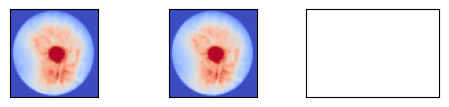

In [57]:
def image_grid():
    figure = plt.figure(figsize=(12,8))

    for i in range(36):
        plt.subplot(6, 6, i + 1)
        # plt.xlabel(class_names[Y_train[i]])
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(X_train[i], cmap=plt.cm.coolwarm)

    return figure

figure = image_grid()

In [59]:
import skimage.io
from matplotlib import pyplot as plt
from patchify import patchify, unpatchify
def plot_to_image(figure):
    buf = io.BytesIO()
    plt.savefig(buf, format='png')
    plt.close(figure)
    buf.seek(0)

    digit = tf.image.decode_png(buf.getvalue(), channels=4)
    digit = tf.expand_dims(digit, 0)

    return digit


In [ ]:
figure = plt.figure(figsize=(12,8))
with file_writer.as_default():
    tf.summary.image("content/gdrive/My Drive/RSAN/Chase/train/images/Image_01R.jpg", plot_to_image(figure), step=0)
    %tensorboard -- logdir=log
    %tensorboard -- logdir logs/plots

In [ ]:
import itertools

def plot_confusion_matrix(cm, class_names):
    figure = plt.figure(figsize=(8, 8))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Accent)
    plt.title("Confusion matrix")
    plt.colorbar()
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names, rotation=45)
    plt.yticks(tick_marks, class_names)

    cm = np.around(cm.astype('float') / cm.sum(axis=1)[:, np.newaxis], decimals=2)
    threshold = cm.max() / 2.

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        color = "white" if cm[i, j] > threshold else "black"
        plt.text(j, i, cm[i, j], horizontalalignment="center", color=color)

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

    return figure


In [61]:
!rm -rf logs

logdir = "/kaggle/working/logs/"
file_writer_cm = tf.summary.create_file_writer(logdir)
from tensorflow import keras
from sklearn import metrics

def log_confusion_matrix(epoch, logs):
    predictions = model.predict(X_test)
    predictions = np.argmax(predictions, axis=1)

    cm = metrics.confusion_matrix(Y_t, predictions)
    figure = plot_confusion_matrix(cm, class_names=class_names)
    cm_image = plot_to_image(figure)

    with file_writer_cm.as_default():
        tf.summary.image("Confusion Matrix", cm_image, step=epoch)

In [62]:

import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"

from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.models import Model

def conv_block(inputs, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(inputs)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def encoder_block(inputs, num_filters):
    x = conv_block(inputs, num_filters)
    p = MaxPool2D((2, 2))(x)
    return x, p

def decoder_block(inputs, skip, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(inputs)
    x = Concatenate()([x, skip])
    x = conv_block(x, num_filters)
    return x

def build_unet(input_shape, num_classes):
    inputs = Input(input_shape)

    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    b1 = conv_block(p4, 1024)

    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    outputs = Conv2D(num_classes, 1, padding="same", activation="softmax")(d4)

    model = Model(inputs, outputs)
    return model


# if __name__ == "__main__":
#     input_shape = (128, 128, 1)
#     model = build_unet(input_shape,1)
#     model.summary()

In [63]:

    """ Model """
    model = build_unet(input_shape,1)
    model.compile(
        loss="categorical_crossentropy")
    model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 64, 64, 1)]          0         []                            
                                                                                                  
 conv2d_76 (Conv2D)          (None, 64, 64, 64)           640       ['input_5[0][0]']             
                                                                                                  
 batch_normalization_72 (Ba  (None, 64, 64, 64)           256       ['conv2d_76[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_72 (Activation)  (None, 64, 64, 64)           0         ['batch_normalization_72

In [64]:
import tensorflow as tf
from datetime import datetime

log_dir = "/content/gdrive/My Drive/logs/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint
from datetime import datetime
import cv2

# Load your pre-trained Retina Segmentation model
#model = load_model('your_pretrained_model.h5')  # Replace with the actual path to your model file
  # """ Model """
model = build_unet(input_shape,1)
model.compile(
        loss="categorical_crossentropy")
# Assuming you have a generator for your image segmentation dataset
# Adjust this part based on your specific data loading and preprocessing steps
def data_generator():
    # Your data loading and preprocessing logic here
    # ...

    while True:
        # Your batch generation logic here
        # yield (batch_inputs, batch_targets)
        yield (np.random.random((batch_size, height, width, channels)), np.random.randint(0, 2, (batch_size, height, width, 1)))

# Function to preprocess input image
def preprocess_input_image(image_path):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (256, 256))  # Adjust the size based on your model's input shape
    img = img / 255.0
    img = np.expand_dims(img, axis=0)
    return img

# Function to generate segmentation mask
def generate_segmentation_mask(model, input_image):
    segmentation_mask = model.predict(input_image)
    segmentation_mask = (segmentation_mask > 0.5).astype(np.uint8)
    return segmentation_mask[0, :, :, 0]

# Function to visualize segmentation
def visualize_segmentation(input_image, segmentation_mask, log_dir, epoch):
    masked_image = cv2.bitwise_and(input_image, input_image, mask=segmentation_mask)

    # Save the results for TensorBoard
    with tf.summary.create_file_writer(log_dir).as_default():
        tf.summary.image(f'Segmentation/Epoch_{epoch}', np.expand_dims(masked_image, axis=0), step=epoch)

# Directory to store TensorBoard logs
log_dir = f'logs/image_segmentation/{datetime.now().strftime("%Y%m%d-%H%M%S")}'

# TensorBoard callback
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1, write_images=True)

# Model checkpoint callback to save the best model based on validation loss
checkpoint_callback =ModelCheckpoint('/content/gdrive/MyDrive/best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)

# Example usage of the generator for training
model.fit(data_generator(), epochs=10, batch_size=8, steps_per_epoch=7,
          validation_steps=7,
          callbacks=[tensorboard_callback, checkpoint_callback])
%load_ext tensorboard
%tensorboard --logdir logs


In [53]:
model.fit(X_train,Y_train, epochs=80, validation_data=(X_test, Y_test), callbacks=[tensorboard_callback])
%load_ext tensorboard
%tensorboard --logdir logs


Epoch 1/80
1/1 [==============================] - 15s 15s/step - loss: 0.0000e+00 - val_loss: 17.2854
Epoch 2/80
1/1 [==============================] - 11s 11s/step - loss: 0.0000e+00 - val_loss: 17.2854
Epoch 3/80
1/1 [==============================] - 11s 11s/step - loss: 0.0000e+00 - val_loss: 17.2854
Epoch 4/80
1/1 [==============================] - 10s 10s/step - loss: 0.0000e+00 - val_loss: 17.2854
Epoch 5/80
1/1 [==============================] - 11s 11s/step - loss: 0.0000e+00 - val_loss: 17.2854
Epoch 6/80
1/1 [==============================] - 11s 11s/step - loss: 0.0000e+00 - val_loss: 17.2854
Epoch 7/80
1/1 [==============================] - 11s 11s/step - loss: 0.0000e+00 - val_loss: 17.2854
Epoch 8/80
1/1 [==============================] - 11s 11s/step - loss: 0.0000e+00 - val_loss: 17.2854
Epoch 9/80
1/1 [==============================] - 12s 12s/step - loss: 0.0000e+00 - val_loss: 17.2854
Epoch 10/80
1/1 [==============================] - 21s 21s/step - loss: 0.0000e+00

<IPython.core.display.Javascript object>

In [ ]:
import keras
from sklearn.metrics import confusion_matrix
from keras.callbacks import TensorBoard
log_folder = "/content/gdrive/My Drive/"
callbacks = [
   TensorBoard(log_folder,
               histogram_freq=1,
               write_graph=True,
               write_images=True,
               update_freq='epoch',
               profile_batch=2,
               embeddings_freq=1),
   keras.callbacks.LambdaCallback(on_epoch_end=log_confusion_matrix)
]

model.fit(X_train, Y_train,
          epochs=100,
          validation_split=0.2,
          callbacks=callbacks)